In [104]:
import re
import torch
import clip
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN
from collections import Counter
from tqdm import tqdm

from get_clip_embeddings import load_product_data, request_image

In [2]:
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
MODEL, PREPROCESS = clip.load("ViT-B/32", device=DEVICE)

In [3]:
DATA_DIR = "/workspace/hongfan_imagegen/data/athome"

In [106]:
df = load_product_data(DATA_DIR)
print(f"Loaded {len(df)} products from At Home.")

Loaded 771 products from At Home.


In [107]:
image_embeddings = np.load('output/embeddings/athome_clip_image_embeddings.npy')
text_embeddings = np.load('output/embeddings/athome_clip_text_embeddings.npy')
print(image_embeddings.shape)
print(text_embeddings.shape)

image_embeddings = image_embeddings.squeeze()

(771, 1, 512)
(771, 2, 512)


In [108]:
pca = PCA()
pca.fit(image_embeddings)

PCA()

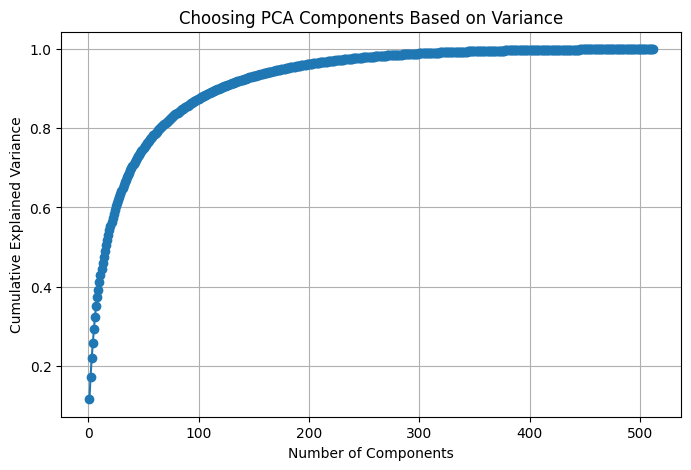

In [109]:
explained_variance = np.cumsum(pca.explained_variance_ratio_)

plt.figure(figsize=(8, 5))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker="o")
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Explained Variance")
plt.title("Choosing PCA Components Based on Variance")
plt.grid()
plt.show()

In [110]:
np.argmax(explained_variance >= 0.8) + 1

65

In [111]:
# Reduce dimensions for clustering
reduced_pca = PCA(n_components=50)
image_embeddings_reduced = reduced_pca.fit_transform(image_embeddings)
image_embeddings_reduced.shape

(771, 50)

100%|██████████| 46/46 [00:34<00:00,  1.32it/s]


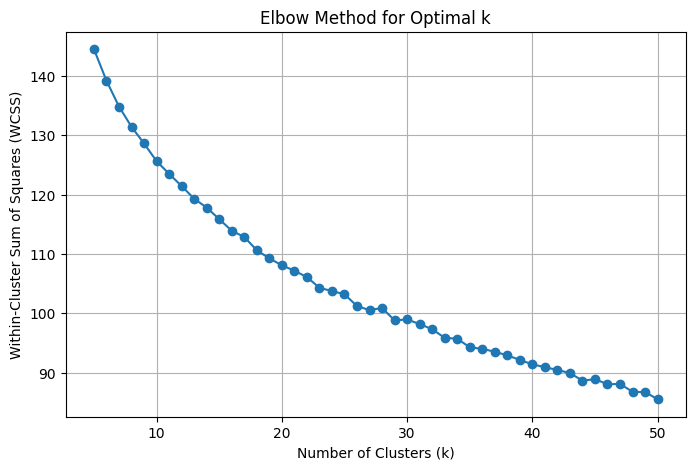

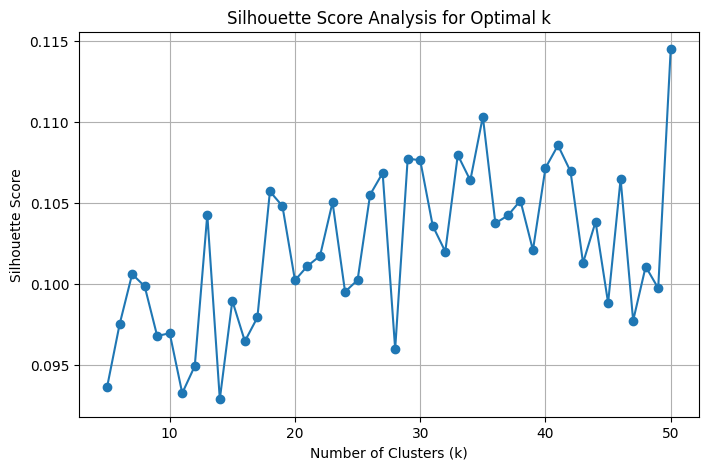

In [95]:
# elbow method to determine n_clusters
wcss = []
silhouette_scores = []

k_values = range(5, 51)

for k in tqdm(k_values):
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(image_embeddings_reduced)
    cluster_labels = kmeans.fit_predict(image_embeddings_reduced)
    silhouette_avg = silhouette_score(image_embeddings_reduced, cluster_labels)
    wcss.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_avg)

# Plot the Elbow Curve
plt.figure(figsize=(8, 5))
plt.plot(k_values, wcss, marker='o', linestyle='-')
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Within-Cluster Sum of Squares (WCSS)")
plt.title("Elbow Method for Optimal k")
plt.grid()
plt.show()

# Plot Silhouette Scores
plt.figure(figsize=(8, 5))
plt.plot(k_values, silhouette_scores, marker='o', linestyle='-')
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Score Analysis for Optimal k")
plt.grid()
plt.show()

In [112]:
num_clusters = 30
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
df['cluster'] = kmeans.fit_predict(image_embeddings_reduced)

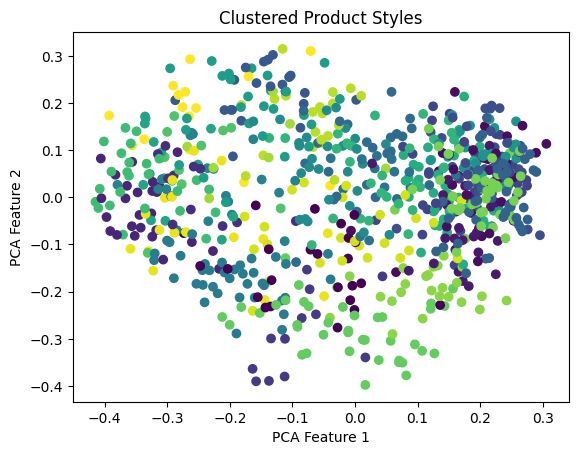

In [113]:
plt.scatter(image_embeddings_reduced[:, 0], image_embeddings_reduced[:, 1], c=df['cluster'], cmap="viridis")
plt.xlabel("PCA Feature 1")
plt.ylabel("PCA Feature 2")
plt.title("Clustered Product Styles")
plt.show()

In [114]:
def clean_text(text):
    words = re.findall(r'\b\w+\b', text.lower())  # Extract words
    return [word for word in words if len(word) > 2]  # Remove short words

def show_cluster_examples(cluster_id, num_samples=5):
    cluster_data = df[df["cluster"] == cluster_id].sample(num_samples)  # Random samples
    width = 5
    fig, axes = plt.subplots(1, num_samples, figsize=(width * num_samples, width))
    
    for i, (index, row) in enumerate(cluster_data.iterrows()):
        img_url = row["img_url"]
        image = request_image(img_url)
        
        axes[i].imshow(image)
        axes[i].axis("off")
        axes[i].set_title(f'{row["category"]}: \n {row["title"]}', fontsize=9)  # Show first 20 chars of title
    
    plt.show()

In [102]:
counts = []

for cluster_id in df['cluster'].unique():
    cluster_data = df[df['cluster'] == cluster_id]
    counts.append({'cluster_id': cluster_id, 'count': len(cluster_data)})

    all_text = " ".join(cluster_data['title'].astype(str) + ' ' + cluster_data['category'].astype(str))
    word_counts = Counter(clean_text(all_text))

    print(f"Cluster {cluster_id} - Common Words:")
    print(word_counts.most_common(10))
    print("-" * 40)

Cluster 15 - Common Words:
[('sculptures', 19), ('statue', 14), ('statues', 14), ('garden', 13), ('outdoor', 12), ('dog', 7), ('figurines', 5), ('dachshund', 4), ('found', 3), ('fable', 3)]
----------------------------------------
Cluster 25 - Common Words:
[('sculptures', 32), ('figurines', 28), ('decor', 14), ('figurine', 11), ('crosby', 9), ('white', 9), ('ceramic', 8), ('outdoor', 7), ('silver', 6), ('found', 4)]
----------------------------------------
Cluster 8 - Common Words:
[('gnome', 33), ('statues', 28), ('sculptures', 28), ('outdoor', 19), ('garden', 18), ('statue', 18), ('sunny', 10), ('club', 10), ('hat', 8), ('yard', 6)]
----------------------------------------
Cluster 14 - Common Words:
[('sculptures', 10), ('statues', 9), ('mushroom', 6), ('sunny', 4), ('club', 4), ('outdoor', 3), ('honeybloom', 2), ('resin', 2), ('frog', 2), ('gnome', 2)]
----------------------------------------
Cluster 11 - Common Words:
[('outdoor', 18), ('blue', 8), ('flower', 8), ('wall', 8), ('de

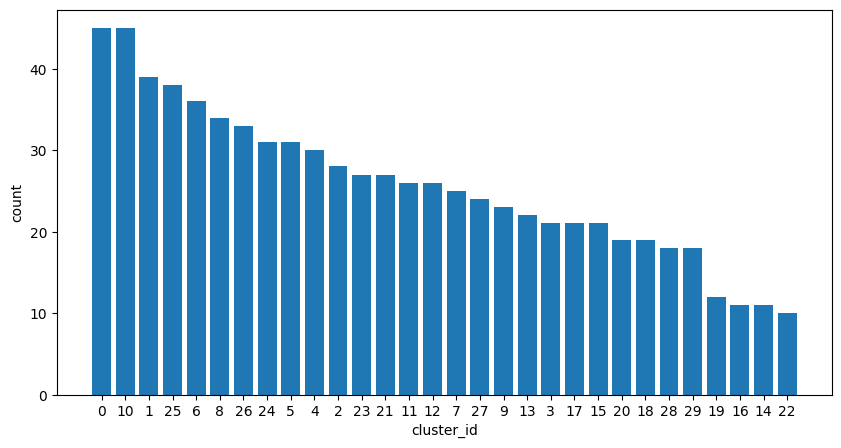

In [125]:
count_df = pd.DataFrame(data=counts)
count_df.sort_values(by='count', ascending=False, inplace=True)
count_df = count_df.reset_index(drop=True)

plt.figure(figsize=(10,5))
plt.bar(range(len(count_df)), count_df['count'], tick_label=count_df['cluster_id'])
plt.xlabel('cluster_id')
plt.ylabel('count')
plt.show()

Cluster 26:


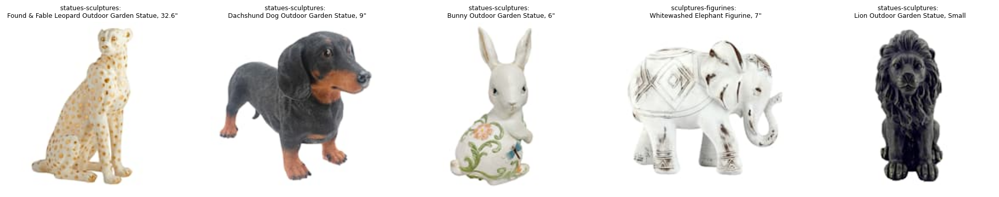

Cluster 19:


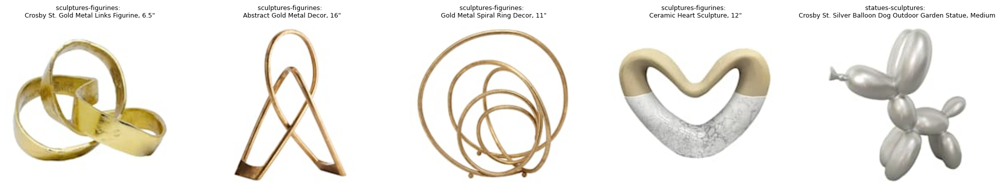

Cluster 16:


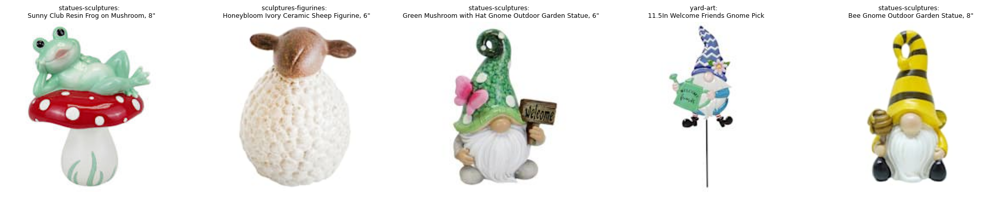

Cluster 10:


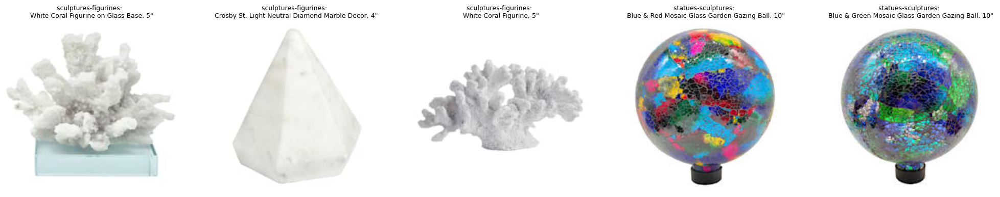

Cluster 0:


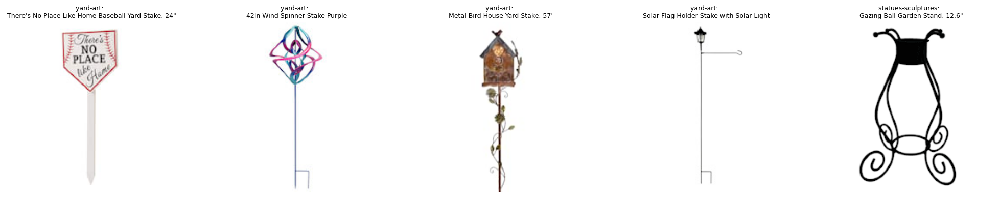

Cluster 21:


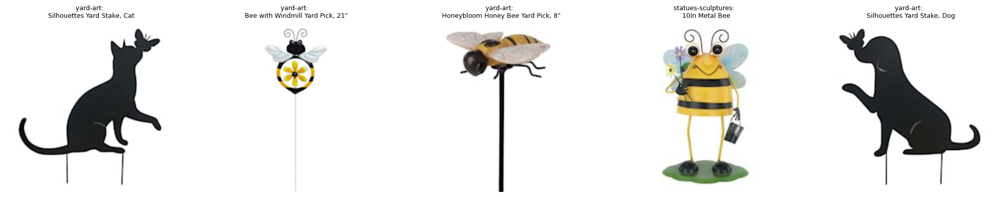

Cluster 17:


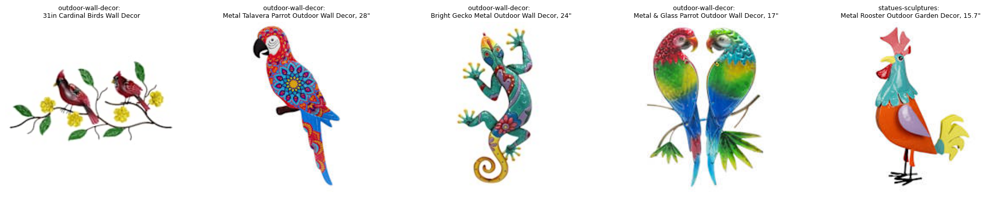

Cluster 29:


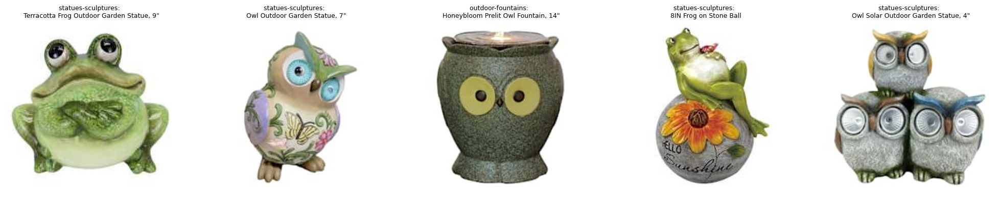

Cluster 8:


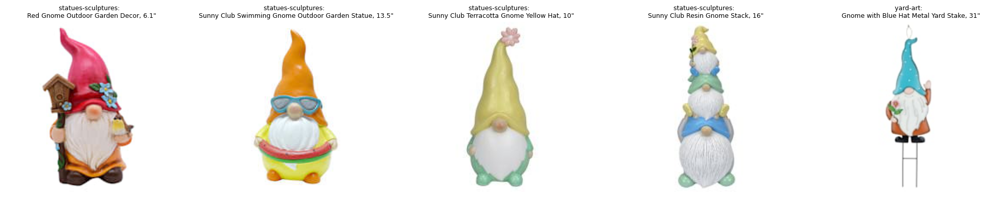

Cluster 3:


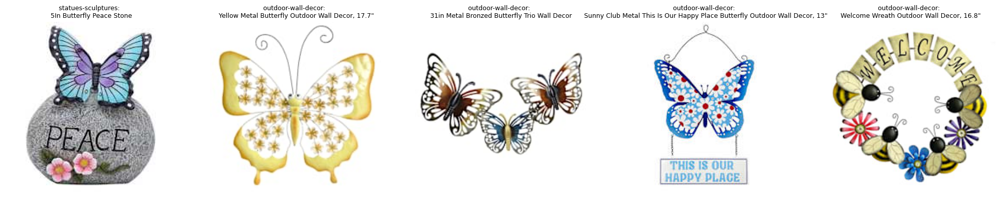

Cluster 6:


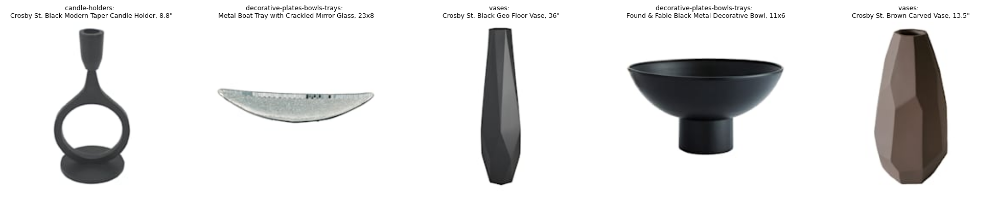

Cluster 14:


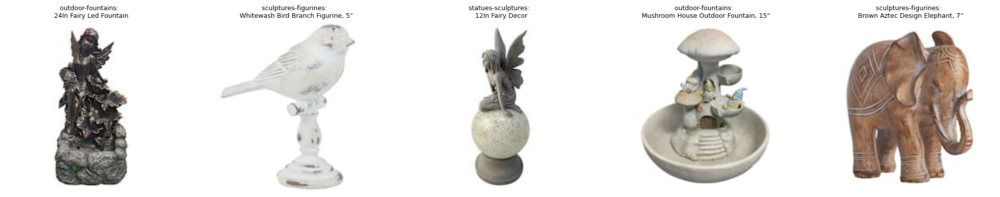

Cluster 25:


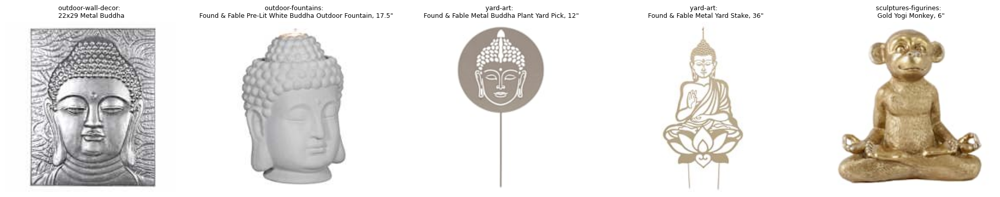

Cluster 4:


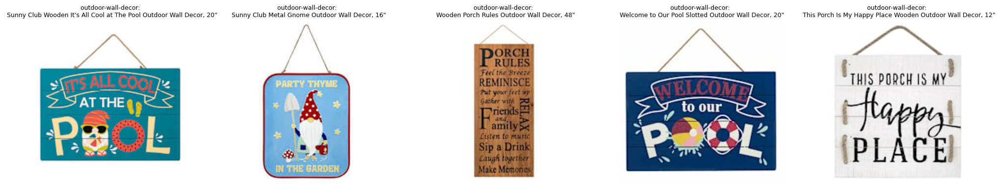

Cluster 20:


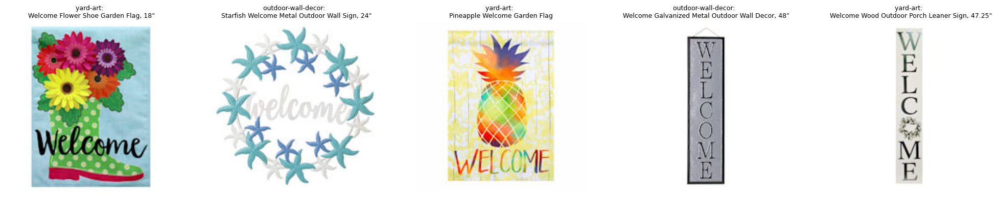

Cluster 13:


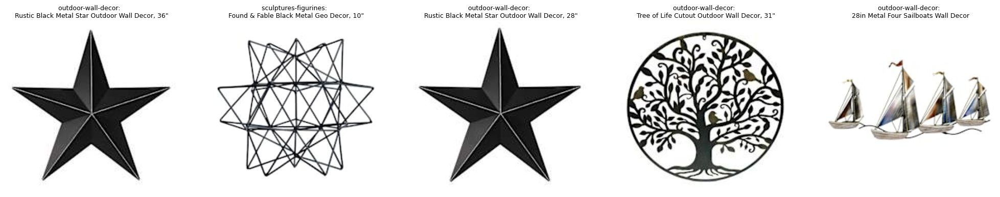

Cluster 28:


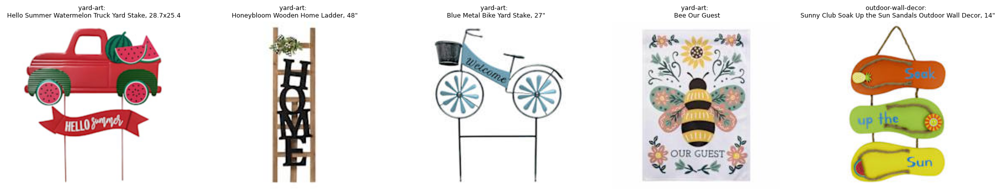

Cluster 27:


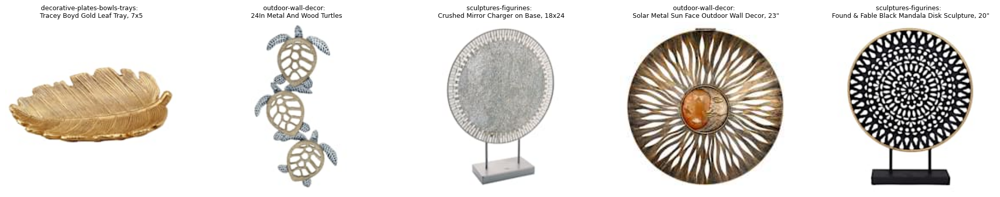

Cluster 5:


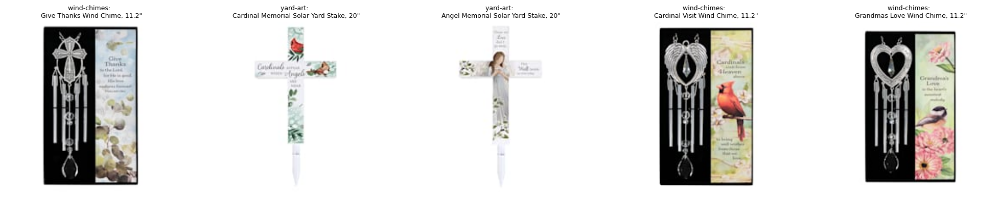

Cluster 22:


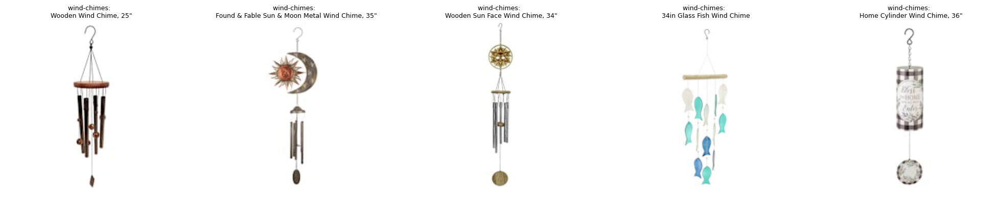

Cluster 24:


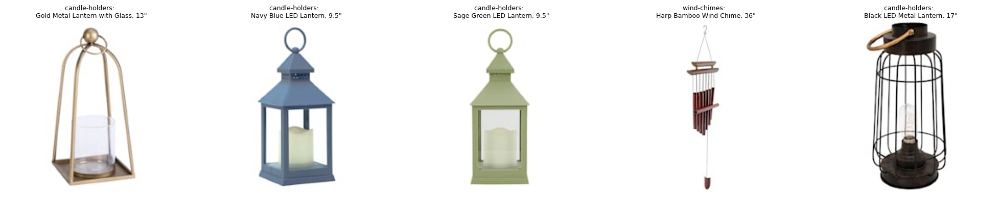

Cluster 12:


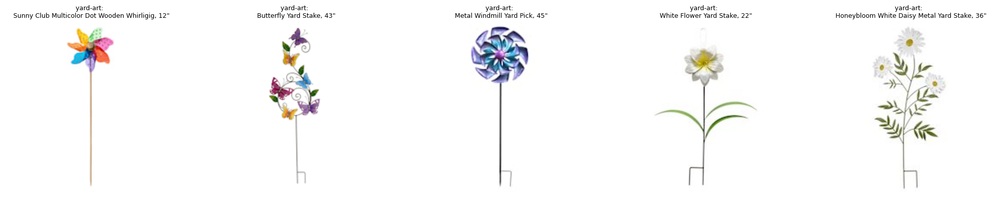

Cluster 2:


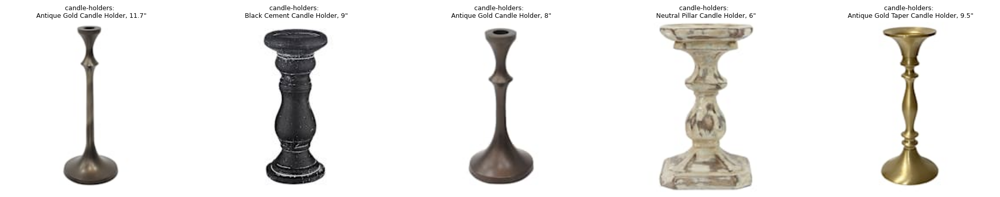

Cluster 18:


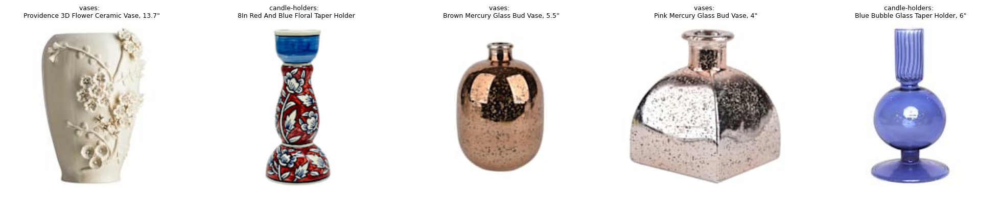

Cluster 1:


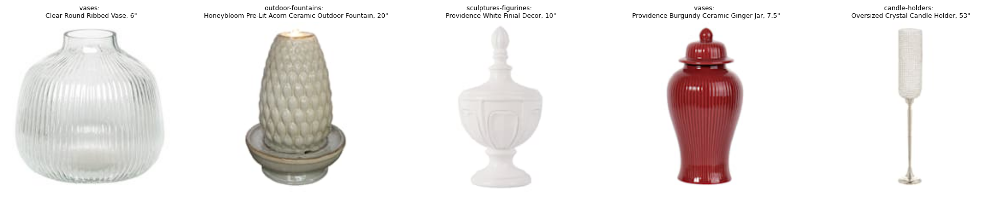

Cluster 11:


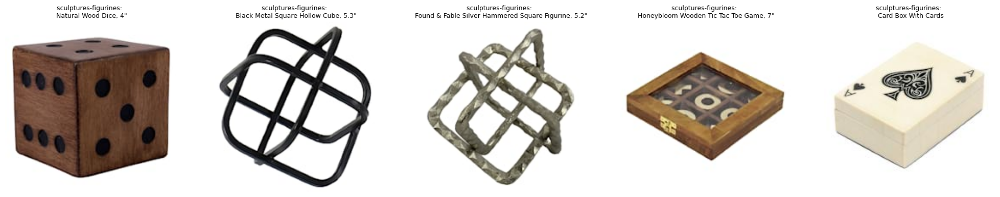

Cluster 9:


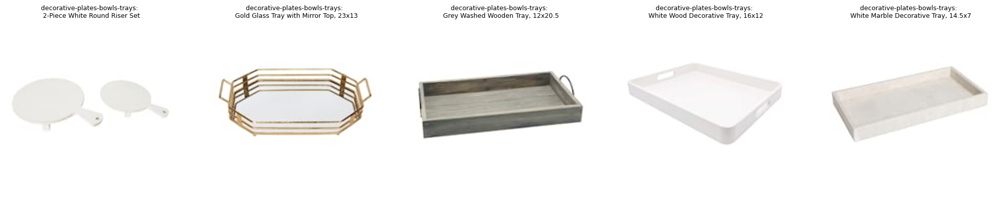

Cluster 7:


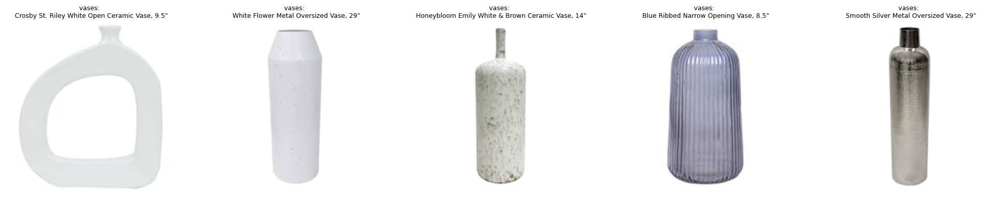

Cluster 15:


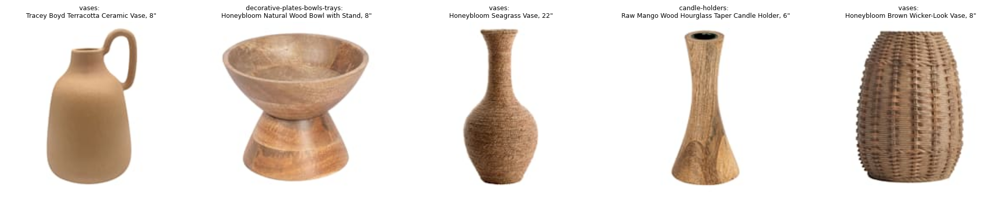

Cluster 23:


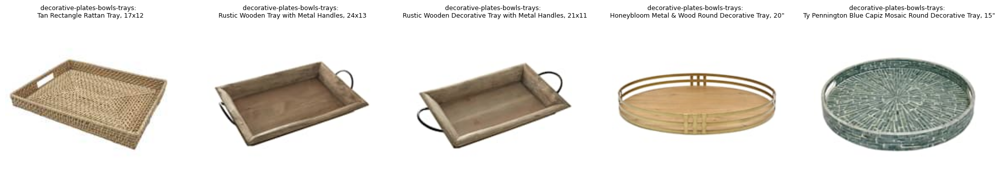

In [126]:
for cluster in df["cluster"].unique():
    print(f"Cluster {cluster}:")
    show_cluster_examples(cluster)

## search for products with text prompt

In [42]:
def find_matching_products(query_text, top_k=8):
    # Encode query text
    text_tokenized = clip.tokenize([query_text]).to(DEVICE)
    with torch.no_grad():
        query_embedding = MODEL.encode_text(text_tokenized).cpu().numpy()
    
    # Compute similarity with all images
    similarities = (image_embeddings @ query_embedding.T).squeeze()
    
    # Get top matching products
    top_matches = df.iloc[np.argsort(-similarities)[:top_k]]

    return top_matches

def display_matching_products(query_text, top_k=8):
    top_matches = find_matching_products(query_text, top_k=top_k)

    titles = []
    categories = []
    images = []
    
    for index in top_matches.index:
        titles.append(top_matches.loc[index, 'title'])
        image_url = top_matches.loc[index, 'img_url']
        image = request_image(image_url)
        images.append(image)
        categories.append(top_matches.loc[index, 'category'])

    if top_k == 1:
        fig, ax = plt.subplots(1, 1, figsize=(6, 6))
    elif int(top_k) % 2 == 0:
        fig, axes = plt.subplots(int(top_k/2),2, figsize=(12, 6*int(top_k/2)))
    else:
        fig, axes = plt.subplots(int(top_k/2)+1,2, figsize=(12, 6*(int(top_k/2)+1)))

    if top_k == 1:
        ax.imshow(images[0])
        ax.axis('off')
    else:
        for ax, img, title, category in zip(axes.flatten(), images, titles, categories):
            ax.imshow(img)
            ax.set_title(f'{category}: {title}', fontsize=10)
            ax.axis('off')
    

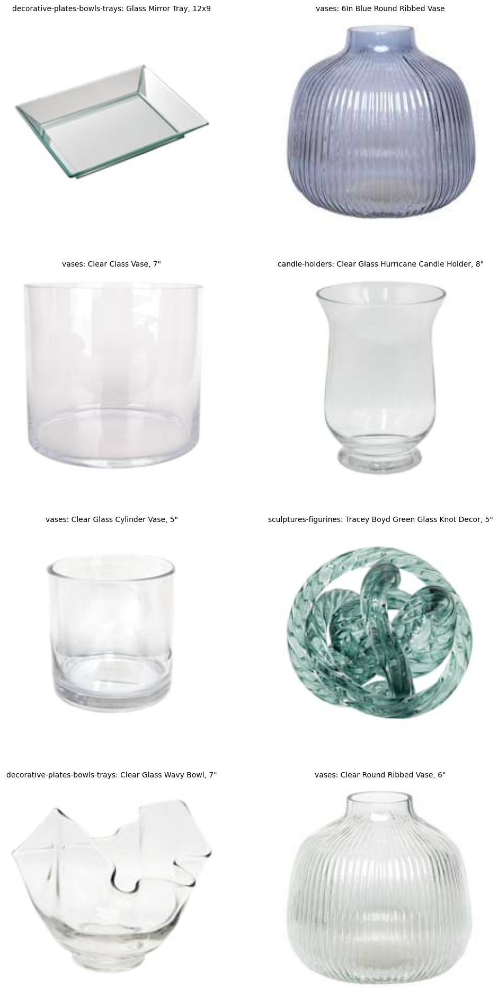

In [132]:
display_matching_products("glass material")